In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ad
import seaborn as sb
import matplotlib.pyplot as plt

sample_name = 'RNAseq'

# 导入表达矩阵
def imput_adata(sample, sample_name):
    adata = sc.read_mtx(sample+'/matrix.mtx.gz')
    adata = adata.T
    bar = pd.read_csv(sample+'/barcodes.tsv.gz', header=None)
    fea = pd.read_csv(sample+'/features.tsv.gz', header=None, sep='\t')
    bar.columns = ['barcodes']
    fea.columns = ['ID', 'name', 'type']
    adata.obs_names = bar.iloc[:,0]
    adata.var_names = fea.iloc[:,1]
    adata.var = fea
    adata.var_names_make_unique()
    adata
    return adata

# 将所有矩阵合并
def concat_adata(adatas):
    
    # 进行数据合并
    adata_concat = adatas[0].concatenate(adatas[1:], batch_categories=sampleNames)
    adata_concat
    return adata_concat
    
# 查看所有细胞中线粒体基因的含量
def show_mito(adata):
    mito_genes = adata.var_names.str.startswith('MT-')
    # the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
    adata.obs['mt_frac'] = np.sum(
        adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
    plt.hist(adata.obs['mt_frac'])
    plt.title
    plt.savefig('figures/mt_fraction'+ sample_name +'.svg')
    return adata
    
# 查看基因表达情况
def show_expr(adata):
    sc.pp.calculate_qc_metrics(adata, percent_top=None, inplace=True)
    fig, axs = plt.subplots(1, 2, figsize=(15, 4))
    fig.suptitle('Covariates for filtering')
    sb.distplot(adata.obs['total_counts'], kde=False, ax=axs[0])
    sb.distplot(adata.obs['total_counts'][adata.obs['total_counts'] < 10000], kde=False, bins=40, ax=axs[1])
    fig.savefig('figures/Covariates'+ sample_name +'.svg')
    return adata
    
# 预处理
def pp(adata, do_harmony=True):
    # 过滤低表达的基因
    sc.pp.filter_cells(adata, min_genes=5)  # 过滤一个细胞中表达少于五个基因的细胞样本 
    sc.pp.filter_genes(adata, min_cells=5)  # 过滤在少于五个细胞中表达的基因
    sc.pp.filter_cells(adata, min_counts=30)   # 过滤每个细胞中计数少于29个的细胞样本 

    # 过滤线粒体核糖体基因
    rp_genes = adata.var_names.str.startswith('RP')
    mt_genes = adata.var_names.str.startswith('MT-')
    adata = adata[:, ~(rp_genes + mt_genes)]
    
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
    sc.pl.highly_variable_genes(adata, save='hvg'+ sample_name +'.svg')
    
    # 通过主成分分析降低数据维度
    adata = adata[adata.obs['mt_frac'] < 0.2]
    sc.tl.pca(adata, svd_solver='arpack')     
    sc.pl.pca_variance_ratio(adata, log=False)
    
    # 进行批次效应处理
    if do_harmony:
        sc.external.pp.harmony_integrate(adata, key='batch',max_iter_harmony=20)
    return adata

# 降维聚类
def clu(adata, n_neighbors=50, n_pcs=15):
    # Computing the neighborhood graph
    sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs)
    # Run UMAP
    sc.tl.umap(adata)
    sc.tl.leiden(adata)
    sc.pl.umap(adata, color="leiden", legend_fontoutline=True, palette=sc.pl.palettes.default_20)
    return adata

In [11]:
import os
from scipy.sparse import csc_matrix, csr_matrix
sampleFolder = 'BCY-scRNA/'
sampleNames = ['1T', '2T', '3T', '4T-Male', '5N', '5T', '6N', '6T', '7N-Male', '8T', '9T', '10T', '10N', '11T', '12N', '12T', '13T', '14T-Male', '15T',  '16N','16T', '17T',  '19T', '20T',  '21T',  '22T']
sampleFiles = [sampleFolder + names for names in sampleNames]
sampleFiles
adatas = []
for i in range(len(sampleNames)):
    adata = imput_adata(sampleFiles[i], sampleNames[i])
    adatas.append(adata)
    
adata_concat = adatas[0].concatenate(adatas[1:], batch_categories=sampleNames)
adata_concat

/home/rzh/BCY/lib/python3.10/site-packages/anndata/utils.py:260: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/anndata/utils.py:260: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/anndata/utils.py:260: UserWarning: Suffix used (-[0-9]+) to d

AnnData object with n_obs × n_vars = 266942 × 61487
    obs: 'batch'

In [14]:
sc.write("BCY-adata-concat.h5ad", adata_concat)

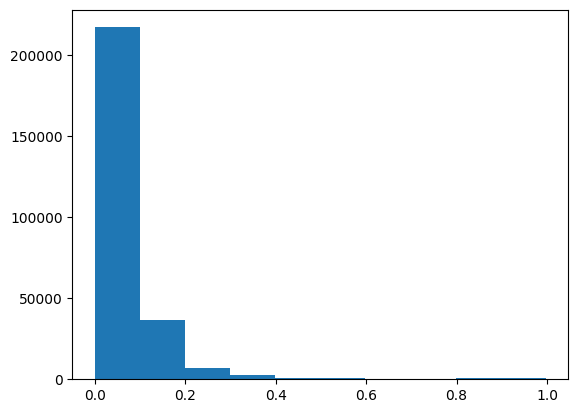

In [16]:
adata_concat = show_mito(adata_concat)

/tmp/ipykernel_2053744/2930181210.py:49: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(adata.obs['total_counts'], kde=False, ax=axs[0])
/tmp/ipykernel_2053744/2930181210.py:50: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(adata.obs['total_counts'][adata.obs['total_counts'] < 10000], kde=False, bi

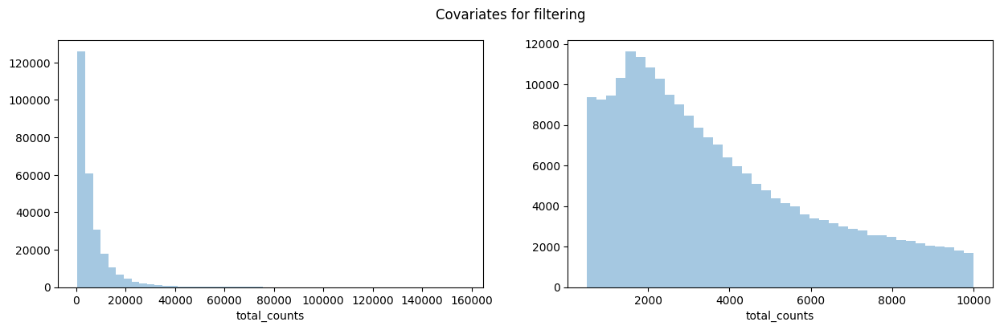

In [18]:
adata_concat = show_expr(adata_concat)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


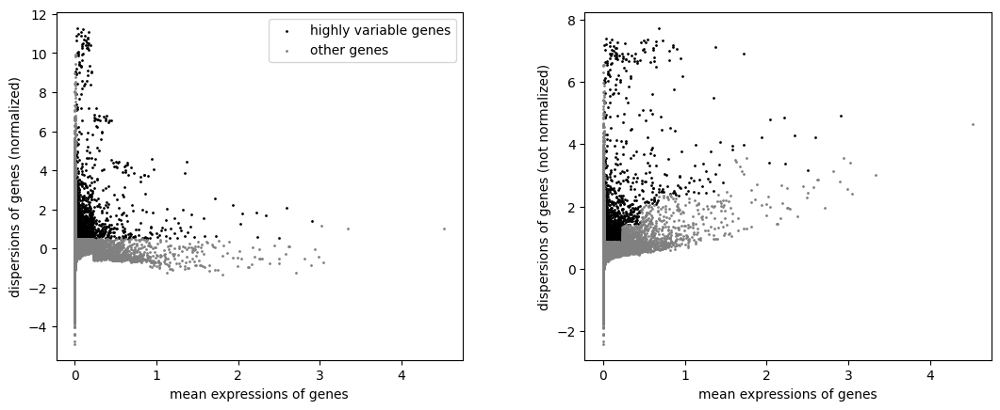

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca


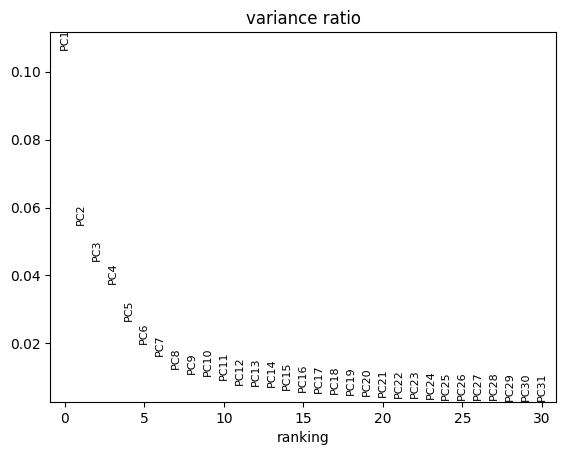

2023-12-19 22:05:53,899 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-12-19 22:06:59,190 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-12-19 22:07:00,271 - harmonypy - INFO - Iteration 1 of 20
2023-12-19 22:08:38,368 - harmonypy - INFO - Iteration 2 of 20
2023-12-19 22:10:13,149 - harmonypy - INFO - Iteration 3 of 20
2023-12-19 22:11:48,810 - harmonypy - INFO - Iteration 4 of 20
2023-12-19 22:13:30,268 - harmonypy - INFO - Iteration 5 of 20
2023-12-19 22:15:09,114 - harmonypy - INFO - Iteration 6 of 20
2023-12-19 22:16:42,863 - harmonypy - INFO - Iteration 7 of 20
2023-12-19 22:17:46,501 - harmonypy - INFO - Converged after 7 iterations


In [21]:
 adata_concat = pp(adata_concat, do_harmony=True)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


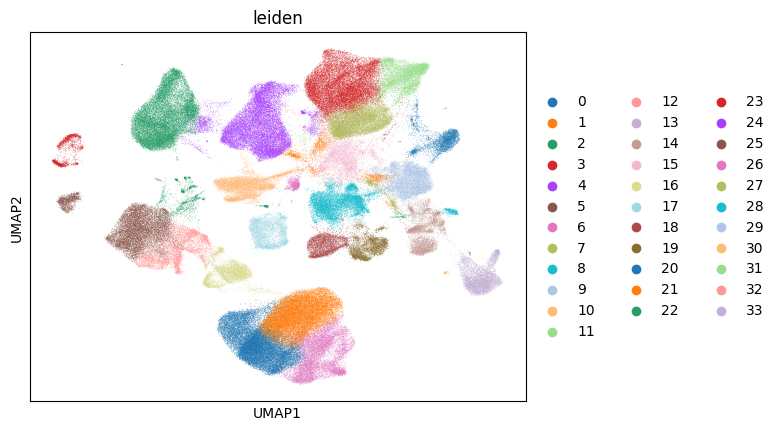

In [25]:
adata_concat = clu(adata_concat, n_neighbors=50, n_pcs=30)

In [26]:
sc.write("BCY-adata-clustered.h5ad", adata_concat)

In [2]:
adata_clustered = sc.read_h5ad("BCY-adata-clustered.h5ad")

/home/rzh/BCY/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


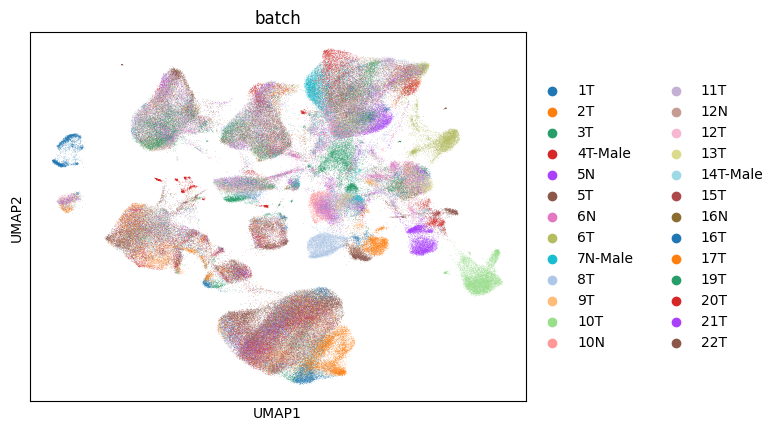

In [19]:
sc.pl.umap(adata_clustered, color="batch", legend_fontoutline=True, palette=sc.pl.palettes.default_20)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


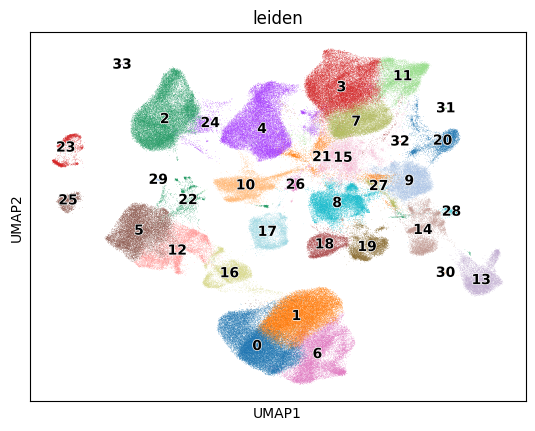

In [9]:
sc.pl.umap(adata_clustered, color="leiden", legend_fontoutline=True, palette=sc.pl.palettes.default_20, legend_loc='on data')

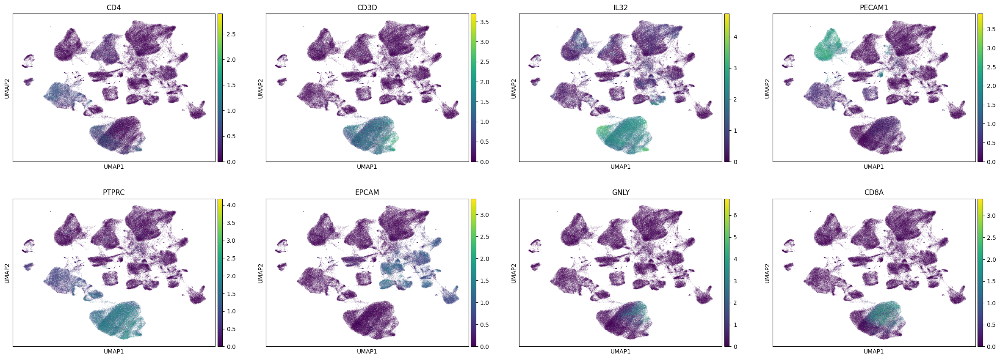

In [8]:
sc.pl.umap(adata_clustered, color=['CD4','CD3D', 'IL32', 'PECAM1', 'PTPRC', 'EPCAM', 'GNLY', 'CD8A'])

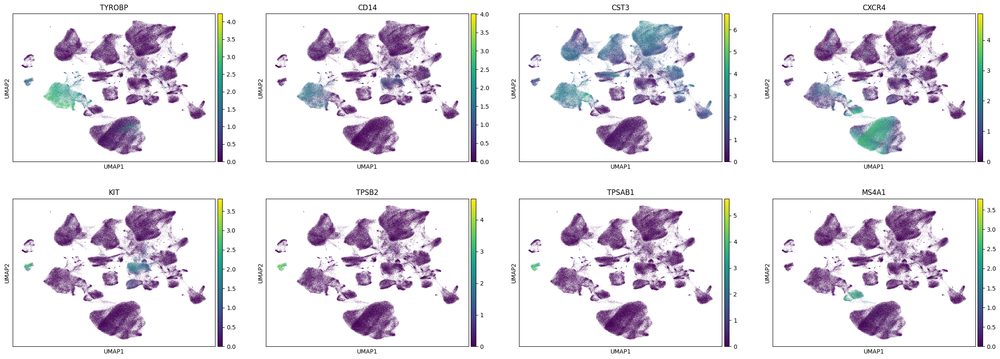

In [11]:
sc.pl.umap(adata_clustered, color=['TYROBP','CD14', 'CST3', 'CXCR4', 'KIT', 'TPSB2', 'TPSAB1', 'MS4A1'])

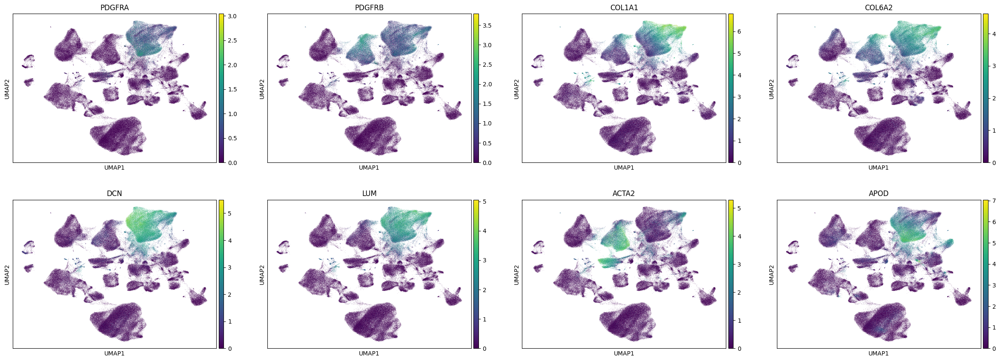

In [13]:
sc.pl.umap(adata_clustered, color=['PDGFRA', "PDGFRB","COL1A1",'COL6A2'
                         ,'DCN', 'LUM', 'ACTA2', 'APOD'])

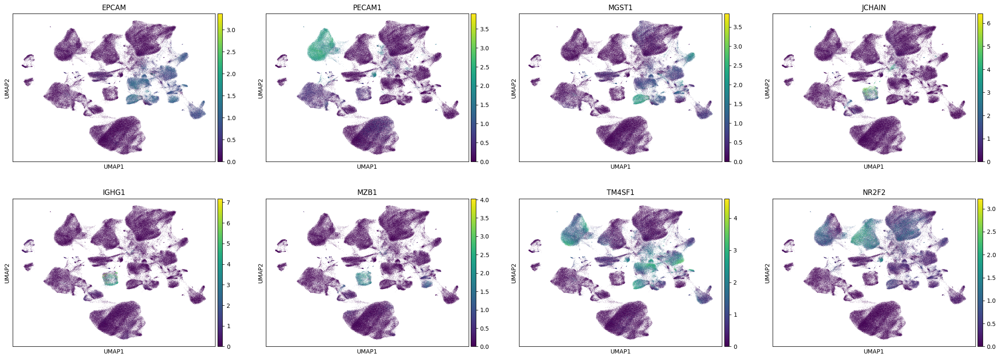

In [16]:
sc.pl.umap(adata_clustered, color=['EPCAM', 'PECAM1', 'MGST1', 'JCHAIN', 'IGHG1', 'MZB1', 'TM4SF1', 'NR2F2'])

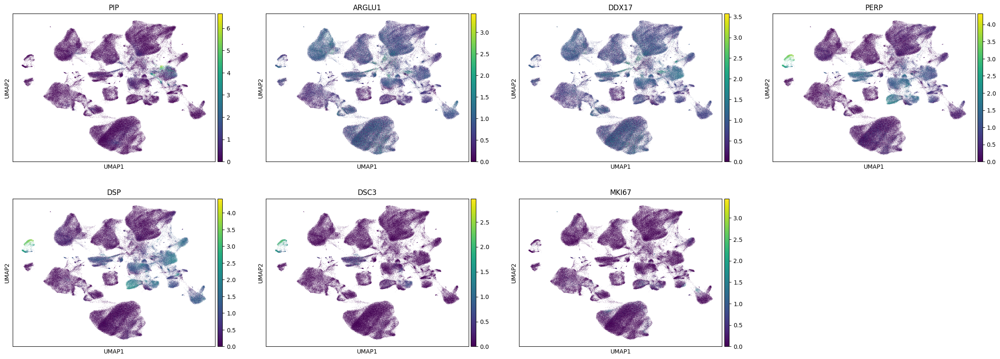

In [20]:
sc.pl.umap(adata_clustered, color=['PIP', 'ARGLU1', 'DDX17', 'PERP', 'DSP', 'DSC3', 'MKI67'])

categories: 0, 1, 2, etc.
var_group_labels: 31, 32, 33


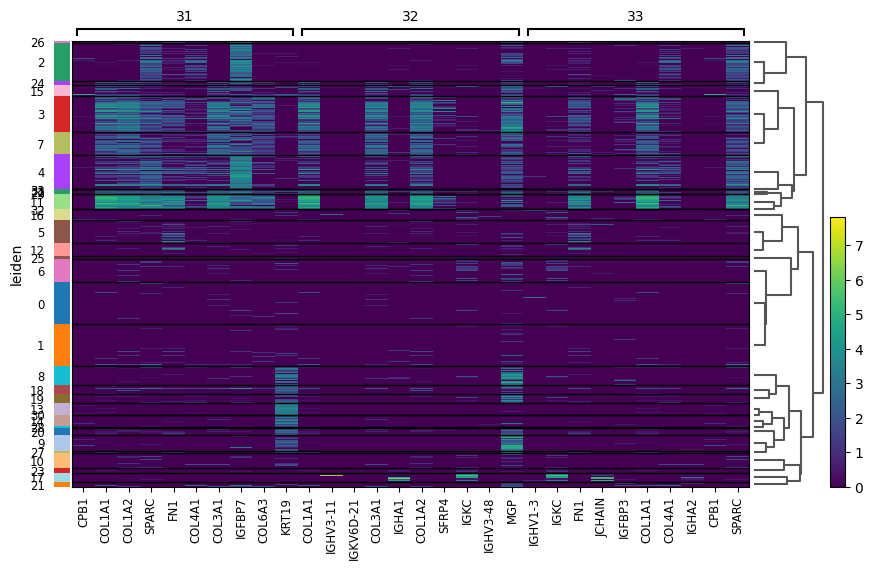

In [21]:
sc.tl.rank_genes_groups(adata_clustered, groupby='leiden', groups=[31, 32, 33])
sc.pl.rank_genes_groups_heatmap(adata_clustered)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the fol

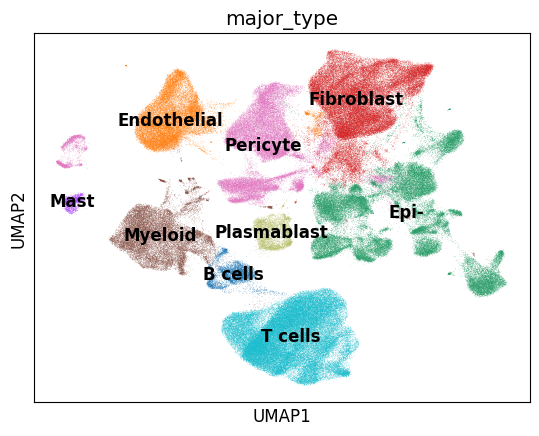

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the fol

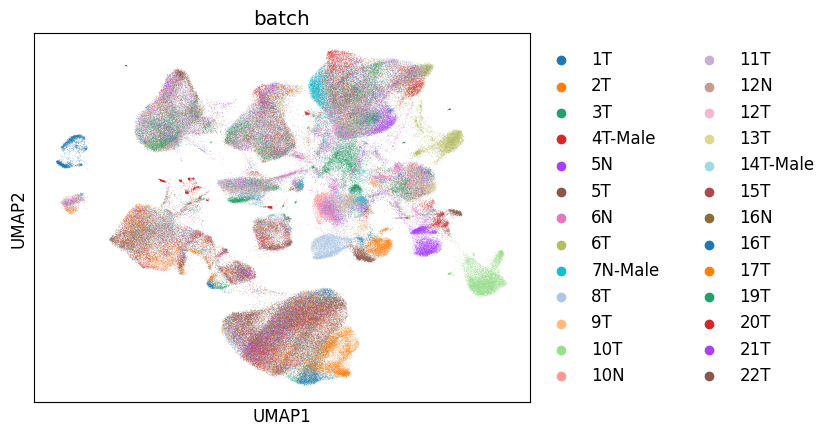

In [26]:
major_dict = {0:'T cells',
           1:'T cells',
           2:'Endothelial',
           3:'Fibroblast',
           4:'Pericyte',
           5:'Myeloid',
           6:'T cells',
           7:'Fibroblast',
           8:'Epi-',
           9:'Epi-',
           10:'Pericyte',
           11:'Fibroblast',
           12:'Myeloid',
           13:'Epi-',
           14:'Epi-',
           15:'Fibroblast',
           16:'B cells',
           17:'Plasmablast',
           18:'Epi-',
           19:'Epi-',
           20:'Epi-',
           21:'Pericyte',
           22:'Myeloid',
           23:'Pericyte',
           24:'Endothelial',
           25:'Mast',
           26:'Pericyte',
           27:'Epi-',
           28:'Epi-',
           29:'Myeloid',
           30:'Epi-',
           31: 'Epi-',
           32: 'Epi-',
           33: 'Endothelial',
           }
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["font.size"] = 12
majorType = list(adata_clustered.obs['leiden'].copy())
majorType = [major_dict[int(i)] for i in majorType]
adata_clustered.obs['major_type'] = majorType
sc.pl.umap(adata_clustered, color="major_type",legend_loc='on data', 
           palette=sc.pl.palettes.default_20,
           save='major_annotation.svg')
sc.pl.umap(adata_clustered, color="batch",save='batch.svg')

In [27]:
adata_epi = adata_clustered[adata_clustered.obs['major_type'] == 'Epi-']

In [31]:
sc.write("adata-epi.h5ad",adata_epi)

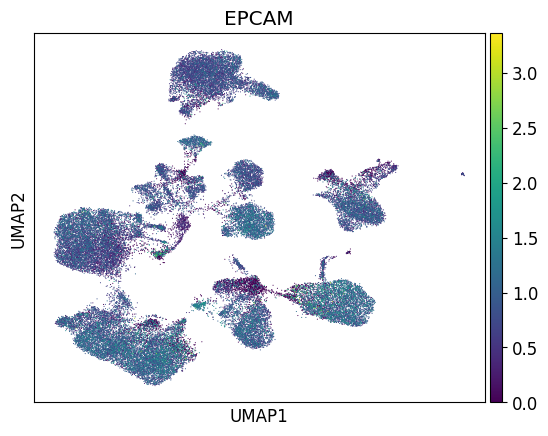

In [48]:
sc.pl.umap(adata_epi, color="EPCAM")

In [70]:
sc.tl.pca(adata_epi, svd_solver='arpack', n_comps=50, use_highly_variable=True)
sc.external.pp.harmony_integrate(adata, key='batch',max_iter_harmony=20)
sc.pp.neighbors(adata_epi, n_neighbors=50, n_pcs=15)
# Run UMAP
sc.tl.umap(adata_epi)
sc.tl.leiden(adata_epi,key_added="leiden-epi")
sc.pl.umap(adata_epi, color="leiden-epi", legend_fontoutline=True, palette=sc.pl.palettes.default_20, legend_loc="on data")
sc.pl.umap(adata_epi, color="batch",  palette=sc.pl.palettes.default_20)

NameError: name 'adata' is not defined

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


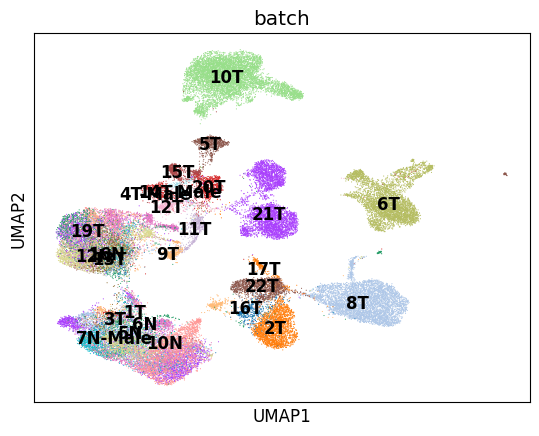

In [49]:
sc.pl.umap(adata_epi, color="batch",  palette=sc.pl.palettes.default_20, legend_loc="on data")

In [42]:
sc.write("adata-epi.h5ad",adata_epi)

In [47]:
plt.rcParams["font.sans-serif"] = ["DejaVu Sans"]

In [50]:
import infercnvpy as cnv 

In [96]:
chrom = pd.read_csv("gene_pos.txt", sep='\t', header=None)
chrom.columns = ["symbol", "ensg", "chromosome", "start", "end"]
chrom.index = chrom['symbol']
chrom['ensg'] = [name.split('.')[0] for name in chrom['ensg']]
chrom

,symbol,ensg,chromosome,start,end
symbol,,,,,
DDX11L1,DDX11L1,ENSG00000223972,chr1,11869,14409
WASH7P,WASH7P,ENSG00000227232,chr1,14404,29570
MIR6859-1,MIR6859-1,ENSG00000278267,chr1,17369,17436
MIR1302-2HG,MIR1302-2HG,ENSG00000243485,chr1,29554,31109
MIR1302-2,MIR1302-2,ENSG00000284332,chr1,30366,30503
...,...,...,...,...,...
MT-ND6,MT-ND6,ENSG00000198695,chrM,14149,14673
MT-TE,MT-TE,ENSG00000210194,chrM,14674,14742
MT-CYB,MT-CYB,ENSG00000198727,chrM,14747,15887


In [124]:
chrom_ensg = chrom.copy()
chrom_ensg.index = chrom_ensg['ensg']
var_names = list(adata_epi.var_names[adata_epi.var_names.isin(chrom['symbol']) + adata_epi.var_names.isin(chrom['ensg'])])
adata_epi_var = adata_epi[:, var_names]
for i in range(len(var_names)):
    name = var_names[i]
    if name in chrom_ensg['ensg']:
        var_names[i] = chrom_ensg['symbol'][name]
chrom_car_names = chrom.loc[var_names, :]

,symbol,ensg,chromosome,start,end
symbol,,,,,
TNFRSF4,TNFRSF4,ENSG00000186827,chr1,1211340,1214153
TNFRSF18,TNFRSF18,ENSG00000186891,chr1,1203508,1206592
ATAD3B,ATAD3B,ENSG00000160072,chr1,1471765,1497848
AL162741.1,AL162741.1,ENSG00000260179,chr1,1249777,1251334
AL590822.1,AL590822.1,ENSG00000234396,chr1,2212523,2220738
...,...,...,...,...,...
AP001042.1,AP001042.1,ENSG00000205622,chr21,38812878,38956467
PAXBP1-AS1,PAXBP1-AS1,ENSG00000238197,chr21,32728097,32747065
AF064858.1,AF064858.1,ENSG00000235888,chr21,38988569,39062894


In [129]:
adata_epi_cnv = adata_epi[:, adata_epi.var_names.isin(chrom['symbol']) + adata_epi.var_names.isin(chrom['ensg'])]
adata_epi_cnv.var_names = var_names
adata_epi_cnv.var = pd.concat([adata_epi_var.var, chrom_car_names], axis=1)
adata_epi_cnv

AnnData object with n_obs × n_vars = 49497 × 39735
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'leiden-epi'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'symbol', 'ensg', 'chromosome', 'start', 'end'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'batch_colors', 'rank_genes_groups', 'dendrogram_leiden', 'major_type_colors', 'leiden-epi_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [136]:
adata_epi_cnv.var_names_make_unique()

In [141]:
cnv.tl.infercnv(adata_epi_cnv,reference_key="batch", reference_cat=['5N', '6N', '7N-Male', '10N', '12N', '16N'])

  0%|          | 0/10 [00:00<?, ?it/s]

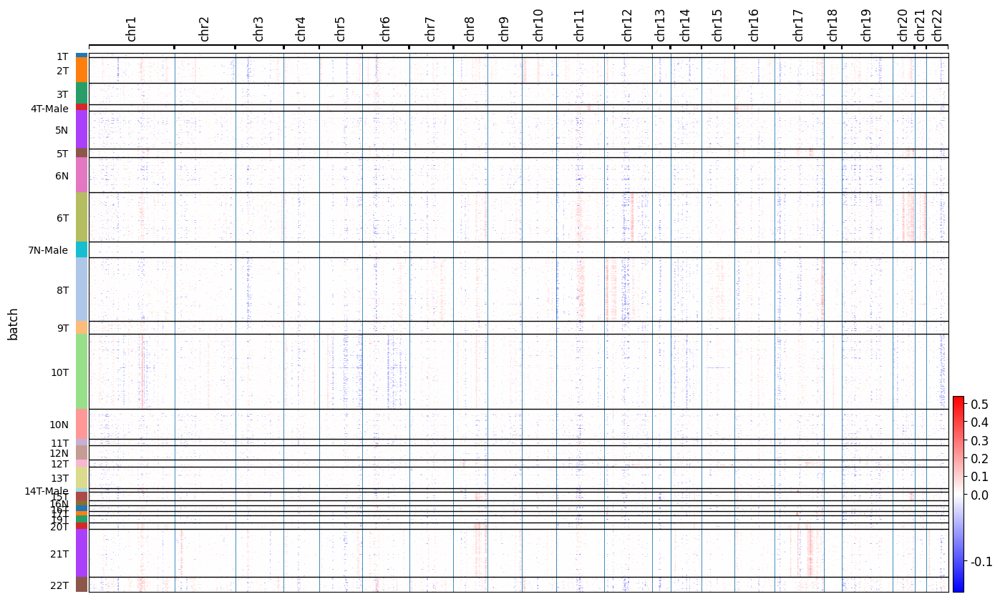

In [176]:
cnv.pl.chromosome_heatmap(adata_epi_cnv, groupby="batch", save="-chromosome-heatmap.svg")

/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


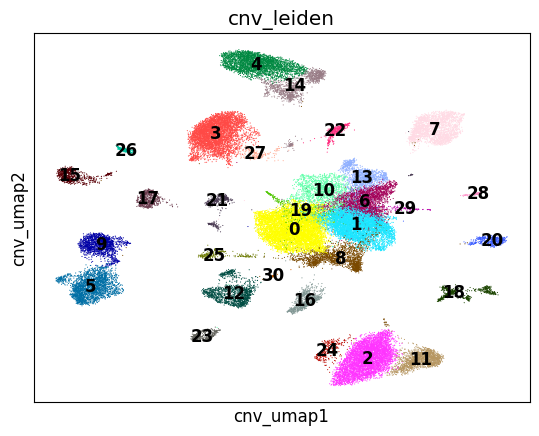

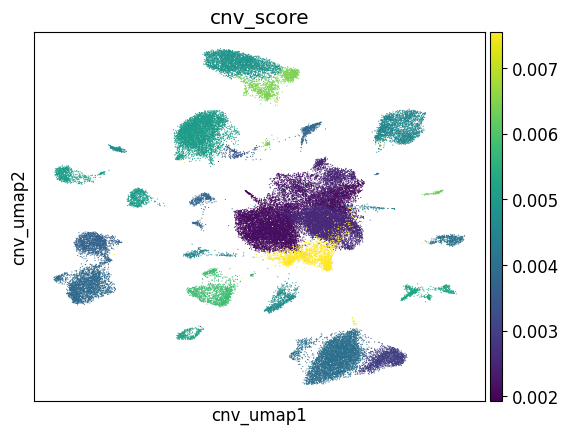

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


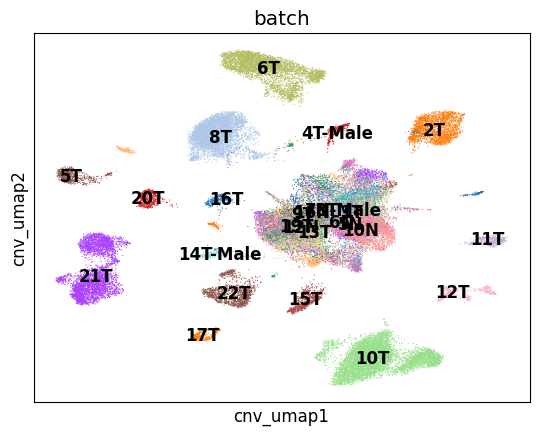

In [143]:
cnv.tl.pca(adata_epi_cnv) 
cnv.pp.neighbors(adata_epi_cnv) 
cnv.tl.leiden(adata_epi_cnv)
cnv.tl.umap(adata_epi_cnv) 
cnv.tl.cnv_score(adata_epi_cnv)
cnv.pl.umap(adata_epi_cnv, color="cnv_leiden", legend_loc='on data', legend_outline=True,save='-epi-cnv-leiden.svg')
cnv.pl.umap(adata_epi_cnv, color="cnv_score",save='-epi-cnv-score.svg')
cnv.pl.umap(adata_epi_cnv, color="batch", legend_loc='on data', legend_outline=True,save='-epi-cnv-batch.svg')
cnv.pl.umap(adata_epi_cnv, color="cnv_status",save='-epi-cnv-status.svg')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


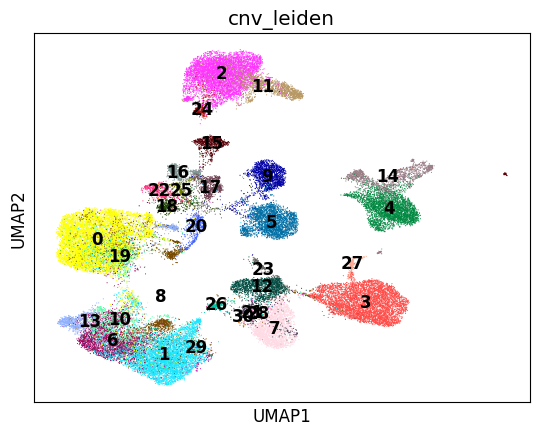

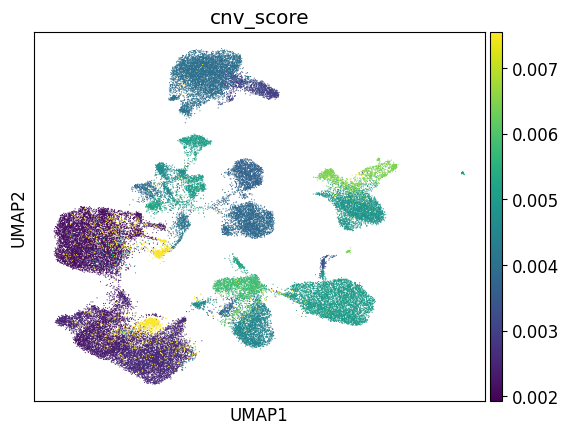

In [180]:
sc.pl.umap(adata_epi_cnv, color="cnv_leiden", legend_loc="on data")
sc.pl.umap(adata_epi_cnv, color="cnv_score")

... storing 'cnv_status' as categorical
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


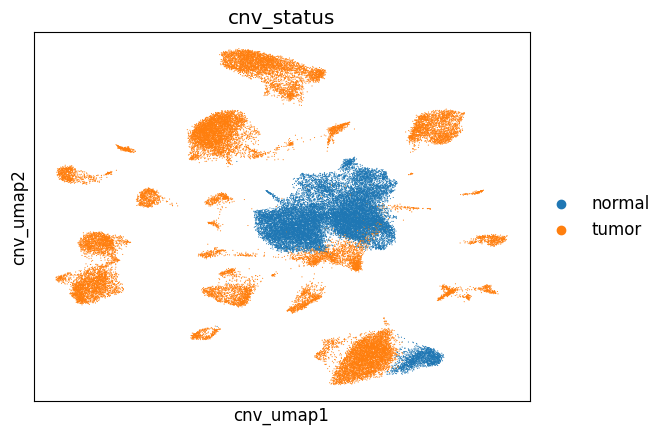

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


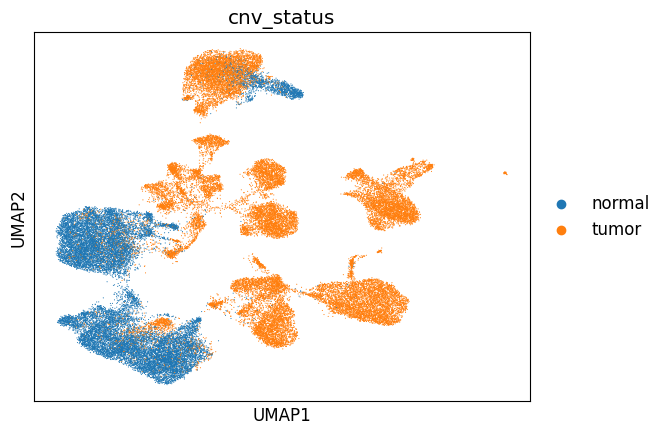

In [148]:
adata_epi_cnv.obs["cnv_status"] = "tumor"
adata_epi_cnv.obs.loc[
    adata_epi_cnv.obs["cnv_leiden"].isin(["0", "1", "6", "19", "10", "13", "11"]), "cnv_status"
] = "normal"
cnv.pl.umap(adata_epi_cnv, color="cnv_status")
sc.pl.umap(adata_epi_cnv, color="cnv_status")

In [149]:
sc.write("adata-epi.h5ad", adata_epi_cnv)

AnnData object with n_obs × n_vars = 49497 × 39735
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'leiden-epi', 'cnv_leiden', 'cnv_score', 'cnv_status'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'symbol', 'ensg', 'chromosome', 'start', 'end'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'batch_colors', 'rank_genes_groups', 'dendrogram_leiden', 'major_type_colors', 'leiden-epi_colors', 'cnv', 'cnv_neighbors', 'cnv_leiden_colors', 'cnv_status_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'X_cnv', 'X_cnv_pca', 'X_cnv_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'cnv_neighbors_distances', 'cnv_neighbors_connectivities'

In [150]:
adata_clustered

AnnData object with n_obs × n_vars = 253234 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'batch_colors', 'rank_genes_groups', 'dendrogram_leiden', 'major_type_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [151]:
fracNames = {'1T':'TNBC', 
             '2T':'TNBC', 
             '3T':'TNBC', 
             '4T-Male':'Luminal B', 
             '5N':'Normal', 
             '5T':'Luminal B', 
             '6N':'Normal', 
             '6T':'Luminal B', 
             '7N-Male':'Normal', 
             '8T':'TNBC', 
             '9T':'TNBC',
             '10T': 'Luminal B', 
             '10N': 'Normal',
             '11T': 'TNBC', 
             '12N': 'Normal', 
             '12T': 'Luminal B', 
             '13T': 'Luminal B', 
             '14T-Male': 'HER2+', 
             '15T': 'Luminal B', 
             '16N': 'Normal', 
             '16T': 'TNBC', 
             '17T':'HER2+', 
             '19T': 'HER2+', 
             '20T': 'Luminal B', 
             '21T': 'HER2+', 
             '22T': 'Luminal B'}

In [159]:
adata_clustered.obs['molecular_type'] = [fracNames[batch] for batch in adata_clustered.obs['batch']]

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


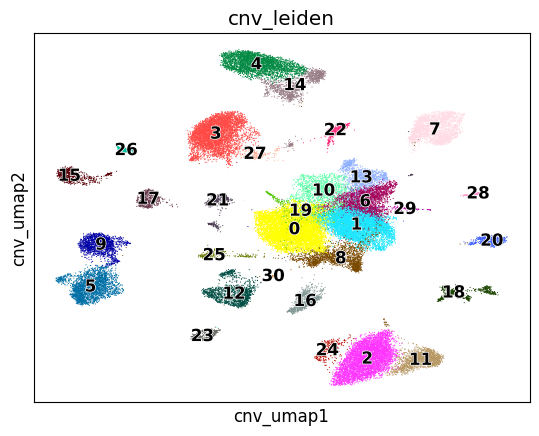

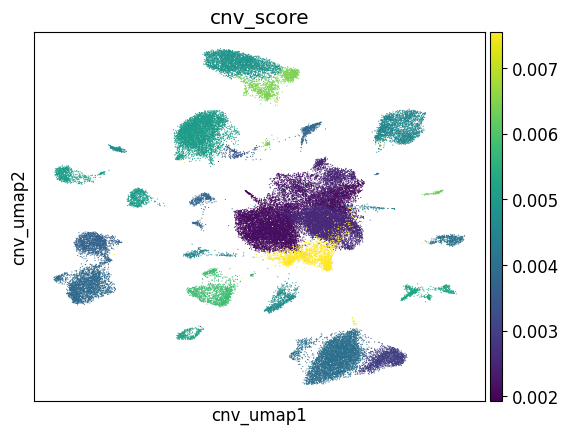

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


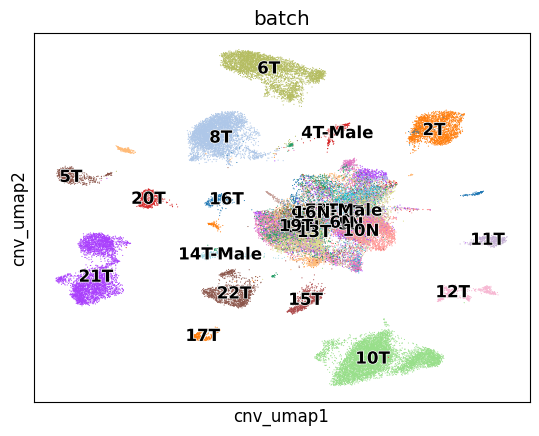

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


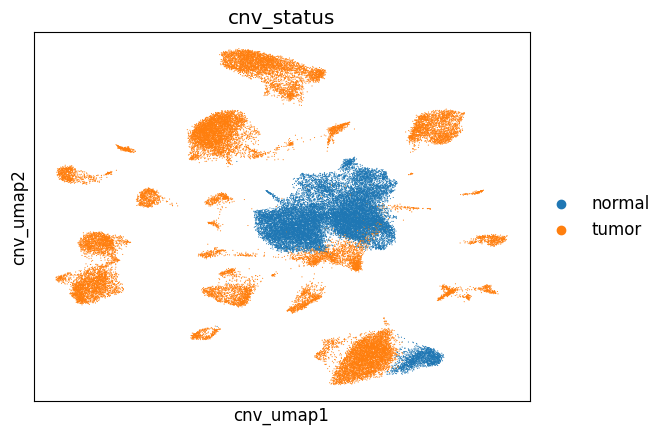

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


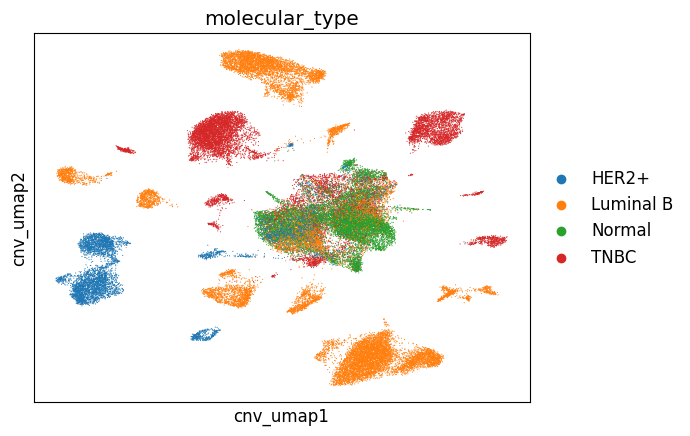

In [179]:
cnv.pl.umap(adata_epi_cnv, color="cnv_leiden", legend_loc='on data', legend_fontoutline=True,save='-epi-cnv-leiden.svg')
cnv.pl.umap(adata_epi_cnv, color="cnv_score",save='-epi-cnv-score.svg')
cnv.pl.umap(adata_epi_cnv, color="batch", legend_loc='on data', legend_fontoutline=True,save='-epi-cnv-batch.svg')
cnv.pl.umap(adata_epi_cnv, color="cnv_status",save='-epi-cnv-status.svg')
cnv.pl.umap(adata_epi_cnv, color="molecular_type",save='-epi-cnv-molecular.svg')

In [178]:
?cnv.pl.umap

Signature: cnv.pl.umap(adata, **kwargs)
Docstring:
Plot the CNV UMAP.

Thin wrapper around :func:`scanpy.pl.embedding`.
File:      ~/BCY/lib/python3.10/site-packages/infercnvpy/pl/__init__.py
Type:      function

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


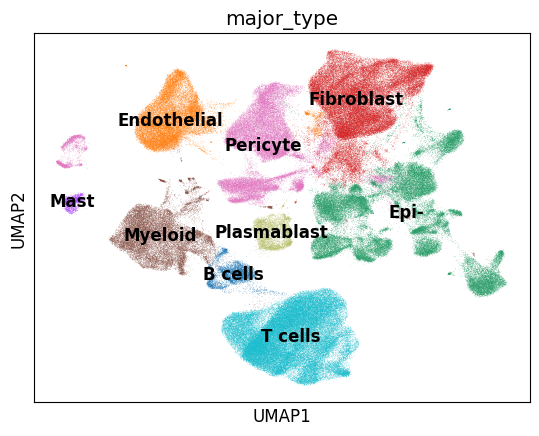

In [168]:
sc.pl.umap(adata_clustered, color="major_type", legend_loc='on data')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


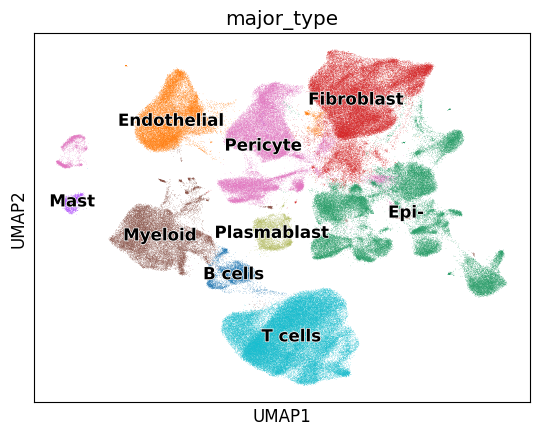

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


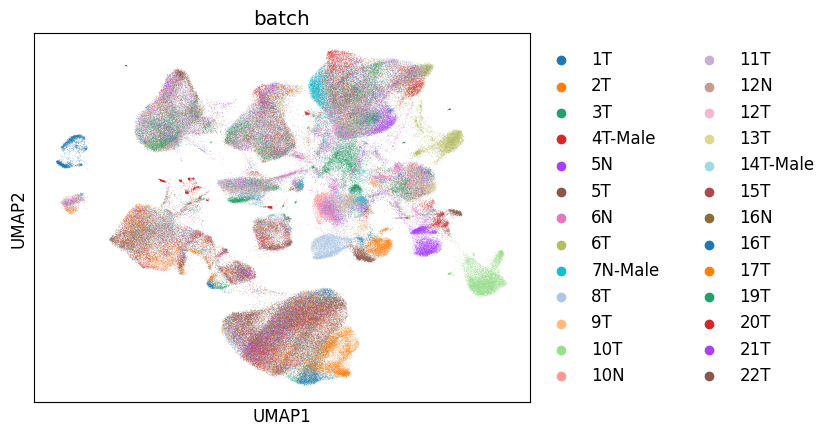

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


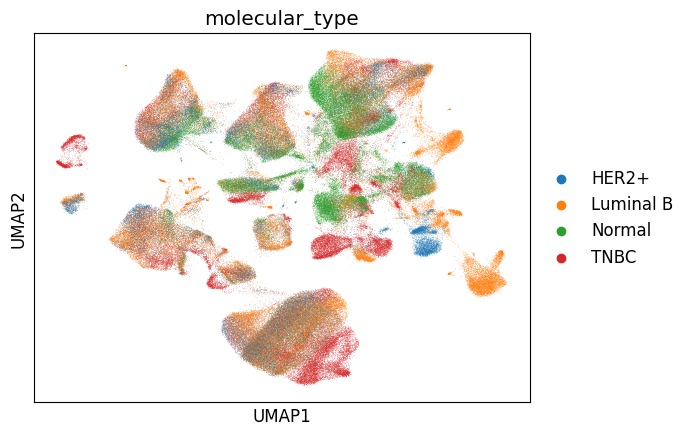

In [175]:
sc.pl.umap(adata_clustered, color="major_type", legend_loc='on data', legend_fontoutline=True, save="-major-type.svg")
sc.pl.umap(adata_clustered, color="batch", save="-batch.svg")
sc.pl.umap(adata_clustered, color="molecular_type", save="-molecular.svg")

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


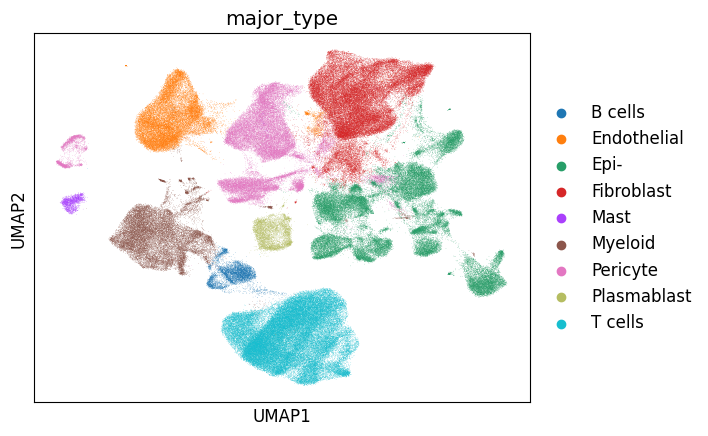

In [181]:
sc.pl.umap(adata_clustered, color="major_type")

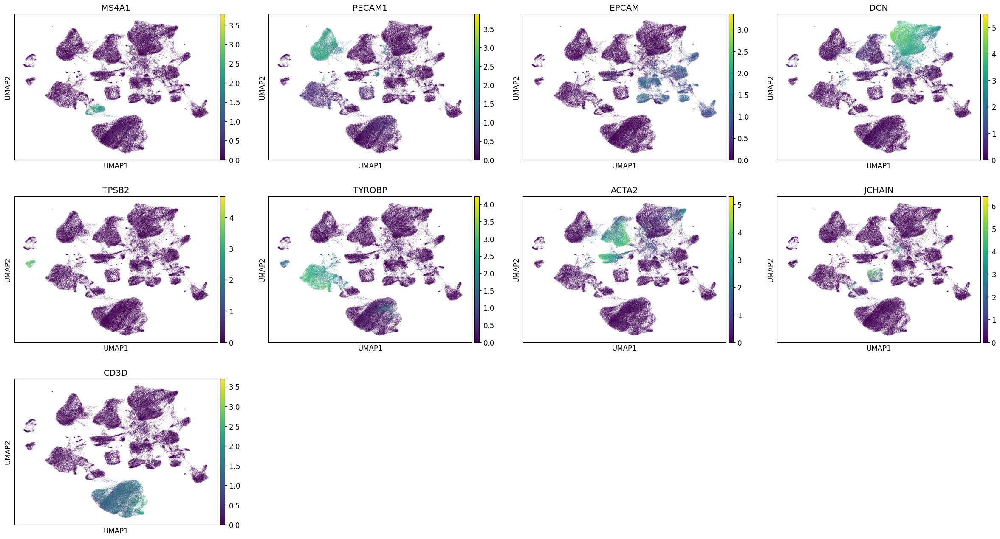

In [183]:
sc.pl.umap(adata_clustered, color=['MS4A1', 'PECAM1', 'EPCAM', 'DCN', 'TPSB2', 'TYROBP', 'ACTA2', 'JCHAIN', 'CD3D'])

NameError: name 'adata_concat' is not defined